In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/competitions/ieee-fraud-detection/sample_submission.csv
/kaggle/input/competitions/ieee-fraud-detection/test_identity.csv
/kaggle/input/competitions/ieee-fraud-detection/train_identity.csv
/kaggle/input/competitions/ieee-fraud-detection/test_transaction.csv
/kaggle/input/competitions/ieee-fraud-detection/train_transaction.csv


In [3]:
train = pd.read_csv('/kaggle/input/competitions/ieee-fraud-detection/train_transaction.csv')
identity = pd.read_csv('/kaggle/input/competitions/ieee-fraud-detection/train_identity.csv')
df = train.merge(identity, how='left', on='TransactionID')

In [4]:
df.head

<bound method NDFrame.head of         TransactionID  isFraud  TransactionDT  TransactionAmt ProductCD  \
0             2987000        0          86400           68.50         W   
1             2987001        0          86401           29.00         W   
2             2987002        0          86469           59.00         W   
3             2987003        0          86499           50.00         W   
4             2987004        0          86506           50.00         H   
...               ...      ...            ...             ...       ...   
590535        3577535        0       15811047           49.00         W   
590536        3577536        0       15811049           39.50         W   
590537        3577537        0       15811079           30.95         W   
590538        3577538        0       15811088          117.00         W   
590539        3577539        0       15811131          279.95         W   

        card1  card2  card3       card4  card5  ...                id

In [5]:
df.info

<bound method DataFrame.info of         TransactionID  isFraud  TransactionDT  TransactionAmt ProductCD  \
0             2987000        0          86400           68.50         W   
1             2987001        0          86401           29.00         W   
2             2987002        0          86469           59.00         W   
3             2987003        0          86499           50.00         W   
4             2987004        0          86506           50.00         H   
...               ...      ...            ...             ...       ...   
590535        3577535        0       15811047           49.00         W   
590536        3577536        0       15811049           39.50         W   
590537        3577537        0       15811079           30.95         W   
590538        3577538        0       15811088          117.00         W   
590539        3577539        0       15811131          279.95         W   

        card1  card2  card3       card4  card5  ...                

In [6]:
df.shape

(590540, 434)

In [7]:
df.describe

<bound method NDFrame.describe of         TransactionID  isFraud  TransactionDT  TransactionAmt ProductCD  \
0             2987000        0          86400           68.50         W   
1             2987001        0          86401           29.00         W   
2             2987002        0          86469           59.00         W   
3             2987003        0          86499           50.00         W   
4             2987004        0          86506           50.00         H   
...               ...      ...            ...             ...       ...   
590535        3577535        0       15811047           49.00         W   
590536        3577536        0       15811049           39.50         W   
590537        3577537        0       15811079           30.95         W   
590538        3577538        0       15811088          117.00         W   
590539        3577539        0       15811131          279.95         W   

        card1  card2  card3       card4  card5  ...              

In [8]:
from sklearn.model_selection import train_test_split

X = df.drop(columns=["isFraud"])
y = df["isFraud"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

print(f"Train size: {X_train.shape}")
print(f"Test size:  {X_test.shape}")

Train size: (472432, 433)
Test size:  (118108, 433)


In [9]:
X_train.describe()

,TransactionID,TransactionDT,TransactionAmt,card1,card2,card3,card5,addr1,addr2,dist1,...,id_17,id_18,id_19,id_20,id_21,id_22,id_24,id_25,id_26,id_32
count,4.724320e+05,4.724320e+05,472432.000000,472432.000000,465254.000000,471179.000000,469033.000000,419692.000000,419692.000000,190577.000000,...,111464.000000,36106.000000,111424.000000,111381.000000,4138.000000,4145.000000,3811.000000,4114.000000,4139.000000,61921.000000
mean,3.282293e+06,7.373037e+06,135.054367,9901.721046,362.498872,153.198326,199.295173,290.897673,86.800301,119.094623,...,189.492787,14.237966,353.134127,403.986398,368.266796,16.013510,12.796379,329.338114,148.964967,26.510166
std,1.705055e+05,4.618224e+06,236.030521,4898.768441,157.749644,11.341956,41.217054,101.782077,2.707016,373.413690,...,30.410590,1.561050,141.034498,152.124305,199.498618,6.918989,2.389390,96.921527,32.279747,3.737753
min,2.987001e+06,8.640100e+04,0.272000,1000.000000,100.000000,100.000000,100.000000,100.000000,10.000000,0.000000,...,100.000000,10.000000,100.000000,100.000000,100.000000,10.000000,11.000000,100.000000,100.000000,0.000000
25%,3.134536e+06,3.025849e+06,43.343000,6019.000000,214.000000,150.000000,166.000000,204.000000,87.000000,3.000000,...,166.000000,13.000000,266.000000,256.000000,252.000000,14.000000,11.000000,321.000000,119.000000,24.000000
50%,3.282420e+06,7.310134e+06,68.950000,9680.000000,361.000000,150.000000,226.000000,299.000000,87.000000,8.000000,...,166.000000,15.000000,341.000000,472.000000,252.000000,14.000000,11.000000,321.000000,147.000000,24.000000
75%,3.430022e+06,1.126472e+07,125.000000,14182.000000,512.000000,150.000000,226.000000,330.000000,87.000000,24.000000,...,225.000000,15.000000,427.000000,533.000000,492.500000,14.000000,15.000000,370.500000,169.000000,32.000000
max,3.577539e+06,1.581113e+07,31937.391000,18395.000000,600.000000,231.000000,237.000000,540.000000,102.000000,10286.000000,...,229.000000,29.000000,671.000000,661.000000,854.000000,44.000000,26.000000,548.000000,216.000000,32.000000


In [10]:
null_percent = X_train.isnull().mean() * 100
null_percent = null_percent.sort_values(ascending=False)

print(null_percent.head(20))  

id_24    99.193323
id_25    99.129187
id_08    99.124953
id_07    99.124953
id_21    99.124107
id_26    99.123895
id_22    99.122625
id_27    99.122625
id_23    99.122625
dist2    93.613049
D7       93.409422
id_18    92.357419
D13      89.481026
D14      89.465151
D12      89.014715
id_04    88.789709
id_03    88.789709
id_33    87.610280
D6       87.585515
id_09    87.338707
dtype: float64


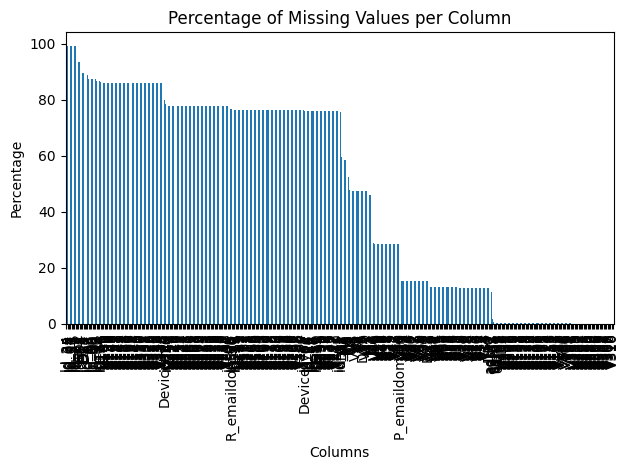

In [11]:
import matplotlib.pyplot as plt

null_percent_nonzero = null_percent[null_percent > 0]

plt.figure()
null_percent_nonzero.plot(kind='bar')
plt.xticks(rotation=90)
plt.title("Percentage of Missing Values per Column")
plt.ylabel("Percentage")
plt.xlabel("Columns")
plt.tight_layout()
plt.show()

In [12]:
cat_cols = [col for col in X_train.columns if X_train[col].dtype == 'object']
num_cols = [col for col in X_train.columns if X_train[col].dtype != 'object']

print(f"Categorical columns ({len(cat_cols)}): {cat_cols}")
print(f"Numerical columns ({len(num_cols)}): {num_cols}")

Categorical columns (31): ['ProductCD', 'card4', 'card6', 'P_emaildomain', 'R_emaildomain', 'M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'id_12', 'id_15', 'id_16', 'id_23', 'id_27', 'id_28', 'id_29', 'id_30', 'id_31', 'id_33', 'id_34', 'id_35', 'id_36', 'id_37', 'id_38', 'DeviceType', 'DeviceInfo']
Numerical columns (402): ['TransactionID', 'TransactionDT', 'TransactionAmt', 'card1', 'card2', 'card3', 'card5', 'addr1', 'addr2', 'dist1', 'dist2', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', '

In [13]:
import matplotlib.pyplot as plt
import math

cols = num_cols
n_cols = 2 
n_rows = math.ceil(len(cols) / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 5 * n_rows))

axes = axes.flatten() 

for i, col in enumerate(cols):
    axes[i].hist(X_train[col].dropna(), bins=20)
    axes[i].set_title(col)

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [15]:
import matplotlib.pyplot as plt
import numpy as np
import math

cols = num_cols
n_cols = 2 
n_rows = math.ceil(len(cols) / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 5 * n_rows))

axes = axes.flatten()

for i, col in enumerate(cols):
    data = X_train[col].dropna()
    
    weights = np.ones(len(data)) / len(data) * 100
    
    axes[i].hist(data, bins=20, weights=weights)
    axes[i].set_title(col)
    axes[i].set_xlabel(col)
    axes[i].set_ylabel("Percentage (%)")
    axes[i].grid(alpha=0.3)

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

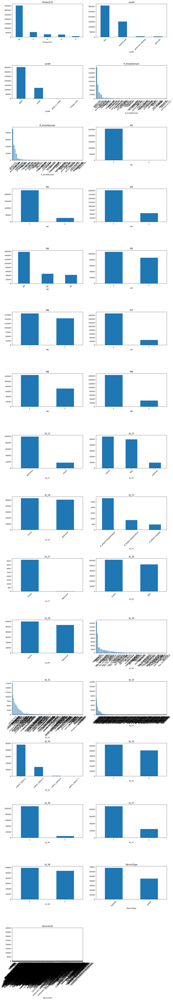

In [16]:

cols = cat_cols
n_cols = 2
n_rows = math.ceil(len(cols) / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 5 * n_rows))
axes = axes.flatten()

for i, col in enumerate(cols):
    X_train[col].value_counts().plot(kind='bar', ax=axes[i])
    axes[i].set_title(col)
    axes[i].tick_params(axis='x', rotation=45)

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

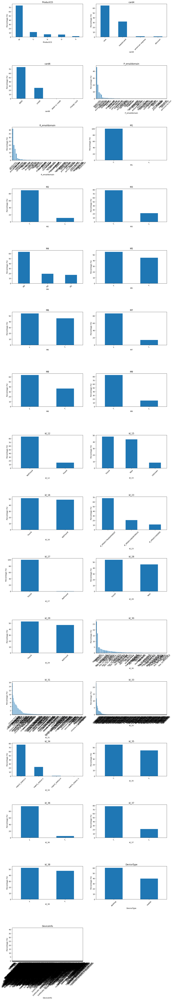

In [17]:
import matplotlib.pyplot as plt
import math

cols = cat_cols
n_cols = 2
n_rows = math.ceil(len(cols) / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 5 * n_rows))
axes = axes.flatten()

for i, col in enumerate(cols):
    (X_train[col]
     .value_counts(normalize=True) 
     .mul(100)                      
     .plot(kind='bar', ax=axes[i]))

    axes[i].set_title(col)
    axes[i].set_ylabel("Percentage (%)")
    axes[i].tick_params(axis='x', rotation=45)

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [18]:
import numpy as np

num_group_70_90 = {}
num_group_90_95 = {}
num_group_95_plus = {}

for col in num_cols:
    data = X_train[col].dropna()
    
    counts, _ = np.histogram(data, bins=20)
    percent = counts / counts.sum() * 100
    
    max_bin = percent.max()
    
    if 70 <= max_bin < 90:
        num_group_70_90[col] = percent
        
    elif 90 <= max_bin < 95:
        num_group_90_95[col] = percent
        
    elif max_bin >= 95:
        num_group_95_plus[col] = percent

print("\n" + "="*60)
print("📊 NUMERIC FEATURE GROUPS BY DOMINANCE")
print("="*60)

print("\n🟡 70–90% dominant features:")
print("-"*40)
print(list(num_group_70_90.keys()))

print("\n🟠 90–95% dominant features:")
print("-"*40)
print(list(num_group_90_95.keys()))

print("\n🔴 95%+ dominant features:")
print("-"*40)
print(list(num_group_95_plus.keys()))


📊 NUMERIC FEATURE GROUPS BY DOMINANCE

🟡 70–90% dominant features:
----------------------------------------
['card3', 'dist2', 'D3', 'D5', 'D6', 'D7', 'D12', 'D14', 'V4', 'V5', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V31', 'V32', 'V33', 'V34', 'V39', 'V42', 'V43', 'V50', 'V51', 'V52', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V71', 'V72', 'V73', 'V74', 'V79', 'V80', 'V81', 'V82', 'V83', 'V84', 'V85', 'V92', 'V93', 'V94', 'V139', 'V140', 'V144', 'V145', 'V148', 'V149', 'V150', 'V151', 'V152', 'V153', 'V154', 'V159', 'V160', 'V165', 'V170', 'V171', 'V174', 'V175', 'V250', 'V251', 'V260', 'V262', 'V282', 'V288', 'V289', 'V302', 'V303', 'V304', 'V328', 'id_01', 'id_05', 'id_06']

🟠 90–95% dominant features:
----------------------------------------
['dist1', 'D13', 'V3', 'V7', 'V24', 'V67', 'V77', 'V78', 'V87', 'V98', 'V100', 'V124', 'V157', 'V158', 'V169', 'V176', 'V184', 'V186', 'V189', 'V194', 'V195', 'V197', 'V223', 'V228', 'V242', 'V244', 'V284', 'V285'

In [19]:
cols = cat_cols

cat_percent = {
    col: X_train[col].value_counts(normalize=True).mul(100)
    for col in cols
}
cat_group_70_90 = {}
cat_group_90_95 = {}
cat_group_95_plus = {}
for col, dist in cat_percent.items():
    max_percent = dist.max()
    
    if 70 <= max_percent < 90:
       cat_group_70_90[col] = dist
        
    elif 90 <= max_percent < 95:
        cat_group_90_95[col] = dist
        
    elif max_percent >= 95:
        cat_group_95_plus[col] = dist
        
print("\n" + "="*60)
print("📊 CATEGORICAL GROUPS SUMMARY")
print("="*60)

print("\n🟢 70–90% dominance")
print("-"*60)
print(list(cat_group_70_90.keys()))

print("\n🟡 90–95% dominance")
print("-"*60)
print(list(cat_group_90_95.keys()))

print("\n🔴 95%+ dominance")
print("-"*60)
print(list(cat_group_95_plus.keys()))


📊 CATEGORICAL GROUPS SUMMARY

🟢 70–90% dominance
------------------------------------------------------------
['ProductCD', 'card6', 'M2', 'M3', 'M7', 'M9', 'id_12', 'id_34', 'id_37']

🟡 90–95% dominance
------------------------------------------------------------
[]

🔴 95%+ dominance
------------------------------------------------------------
['M1', 'id_27', 'id_36']
